# Simulação computacional de propagação de calor

# Introdução
### Este trabalho visa simular a propagação de calor em função do tempo em superfícies bidimensionais de diferentes materiais e exibí-la através de um mapa de calor, utilizando a Interpolação Bilinear para suavizar a coloração no limite entre pontos.

# Fórmulas necessárias

Primeiramente, vamos dar uma olhada na equação do calor, que é uma equação diferencial parcial representando a difusão do calor em sólidos. A fórmula é escrita da forma:

$${\displaystyle {\frac {\partial u}{\partial t}}= \alpha \left({\frac {\partial ^{2}u}{\partial x_{1}^{2}}}+\cdots +{\frac {\partial ^{2}u}{\partial x_{n}^{2}}}\right),}$$


onde:

$u$ = temperatura \
$t$ = tempo \
$x_1, \cdots , x_n$ = coordenada na dimensão i, para $1 \leq i \leq n$ \
$\alpha$ = coeficiente de difusão térmica do material

\
Como iremos fazer a simulação em um plano cartesiano 2D convencional, teremos como fórmula:

$${\displaystyle {\frac {\partial u}{\partial t}}= \alpha \left({\frac {\partial ^{2}u}{\partial x^{2}}}+{\frac {\partial ^{2}u}{\partial y^{2}}}\right)}$$

\
Para calcular essas derivadas parciais, podemos usar o **método das diferenças finitas** e achar seu valor aproximado. Lembrando que, derivada, por definição, é:

$$f'(x)=\lim _{{h\to 0}}{\frac {f(x+h)-f(x)}{h}},$$

sendo:

$$f'(x)≈{\frac {f(x+h)-f(x)}{h}}$$ 

e 

$${\displaystyle f''(x)≈{\frac {f(x+h)-2f(x)+f(x-h)}{h^{2}}}}$$

para um h (espaçamento entre dois pontos x) muito pequeno.

\
Para este trabalho, utilizarei:

$Δx$ para a distância entre dois pontos x consecutivos,<br>$x_i$ o i-ésimo ponto x
$$x_i = iΔx$$


$Δy$ para a distância entre dois pontos y consecutivos,<br>$y_j$ o j-ésimo ponto y;
$$y_j = jΔy$$


$Δt$ para a diferença entre duas unidades de tempo consecutivas,<br>$t_k$ a k-ésima porção de tempo:
$$t_k = kΔt$$


Logo, a solução será $u(x,y,t) = u_{i,j}^k$ = temperatura na linha i, coluna j e tempo k


Voltando para a solução das diferenças finitas:

$${\displaystyle {\frac {\partial u}{\partial t}}= \alpha \left({\frac {\partial ^{2}u}{\partial x^{2}}}+{\frac {\partial ^{2}u}{\partial y^{2}}}\right)}$$

$${\displaystyle
{\frac {{u_{i,j}^{k+1}}- u_{i,j}^{k}}{\Delta t}}
- \alpha
\left(
{\frac {{u_{i+1,j}^{k}} - 2{u_{i,j}^{k}} + {u_{i-1,j}^{k}}}{\Delta x^{2}}}
+
{\frac {{u_{i,j+1}^{k}} - 2{u_{i,j}^{k}} + {u_{i,j-1}^{k}}}{\Delta y^{2}}}
\right) = 0}$$

Se organizarmos a equação acima tomando $Δx = Δy$ (variação igual nas duas dimensões), obteremos esta equação final:

$${\displaystyle
{u_{i,j}^{k+1}}
= \gamma
\left(
{u_{i+1,j}^{k}}
+
{u_{i-1,j}^{k}}
+
{u_{i,j+1}^{k}}
+
{u_{i,j-1}^{k}}
-
4{u_{i,j}^{k}}
\right) + {u_{i,j}^{k}} = 0,}$$

onde:

$$\gamma = \alpha {\frac{\Delta t}{\Delta x^2}}$$

Assim, está visível que a temperatura em um ponto (i,j) no tempo k+1 depende de 5 pontos no tempo k:
- o próprio ponto
- o ponto (i+1,j)
- o ponto (i-1,j)
- o ponto (i,j+1)
- o ponto (i,j-1)

# Aplicação

Abaixo, temos alguns coeficientes de difusividade térmica (o nosso alfa) de diversos materiais. Utilizaremos alguns para a simulação da propagação do calor em superfícies feitas por esses materiais.

In [1]:
# coeficientes de difusividade térmica

carbono_pirolitico = 1220 # similar ao grafite
diamante = 1100
carbono = 216.5 # 25°C
helio = 190 # 300 K, 1 atm
prata = 165.63  # puro (99.9%)
hidrogenio = 160 # 300 K, 1 atm
ouro = 127
cobre = 111 # 25°C
aluminio = 97
vapor_agua = 23.38
ferro = 23
ar = 19
tijolo = 0.52
vidro = 0.34
agua = 0.143 # 25°C
borracha = 0.1
nylon = 0.09
madeira = 0.082

In [ ]:
# para display de gifs posteriormente

from google.colab import drive
from IPython.display import display, Image

drive.mount('/gdrive')

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).


Transformando a equação final em código:

Em *init*, é criado o array que irá conter os valores das temperaturas em todos os pontos e ele é inicializado com uma determinada condição inicial: a superfície está em temperatura ambiente (25°C) e sofre incidência direta de calor na borda inferior (100°C) e na borda lateral esquerda (50°C).

Como resultado, a função *calcula*, ao utlizar a fórmula explicitada anteriormente, retorna todos os valores de todos os pontos em todas as unidades de tempo determinadas pela variável *iteracoes*. A função *run* é responsável por exibir, a cada unidade de tempo, o mapa de calor com os respectivos pontos e seus valores (temperaturas).

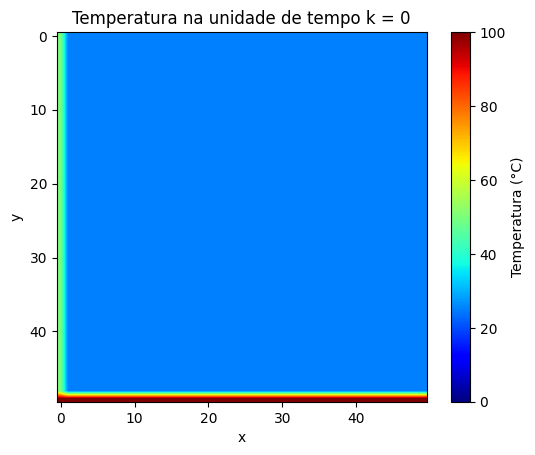

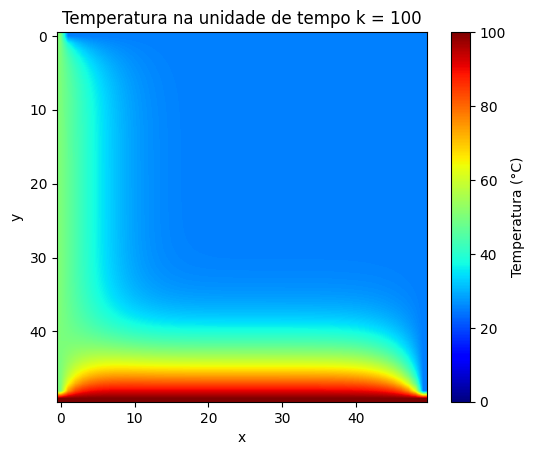

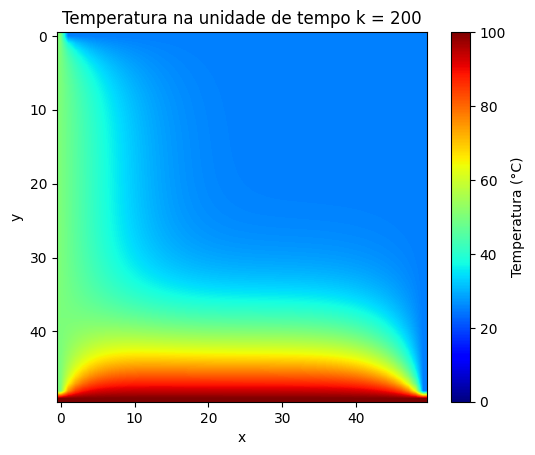

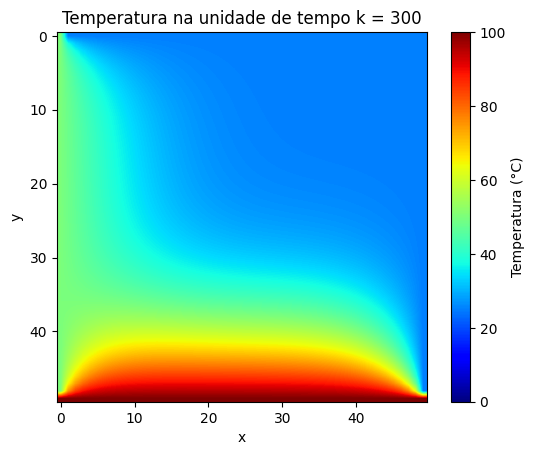

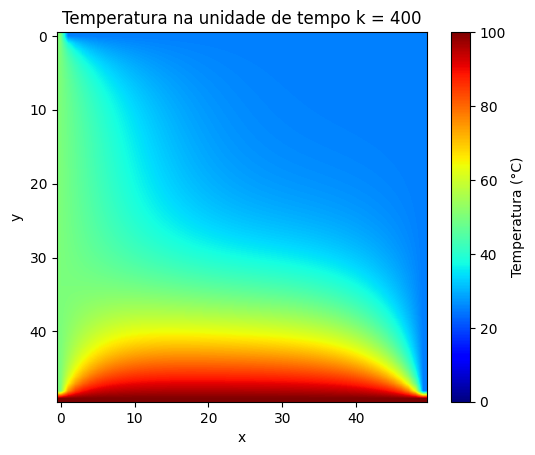

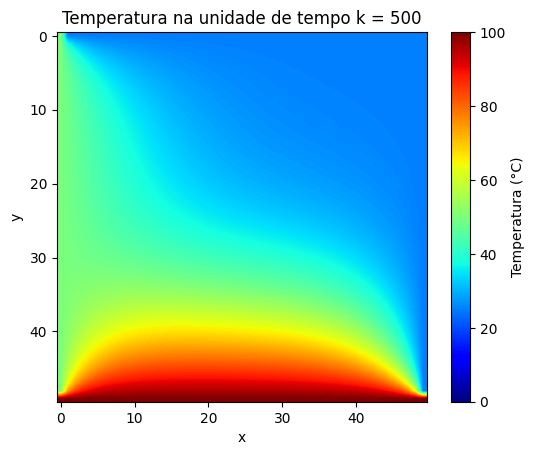

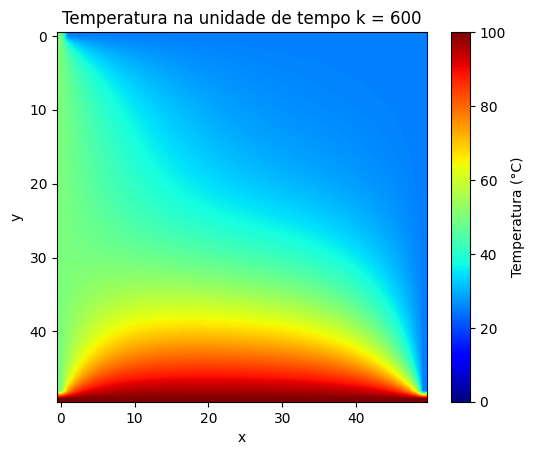

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.animation import FuncAnimation

linhas = 50
colunas = 50
iteracoes = 602


def init():
    # criando a matriz
    u = np.empty((iteracoes, linhas, colunas)) #u[tempo][x][y]

    u_inicial = 25 # 25°C - temperatura ambiente

    # inicializando a matriz na condição inicial
    u.fill(u_inicial)

    u_baixo = 100.0
    u_esq = 50.0
    u_cima = 0.0
    u_dir = 0.0

    # inicializando as condições das bordas (o : na primeira dimensao significa que está tendo incidencia contínua nesses pontos da superficie)
    u[:, :, :1] = u_esq
    u[:, (linhas-1):, :] = u_baixo

    return u

def calcular(u, coeficiente):
    alpha = coeficiente
    delta_x = 1

    delta_t = ((delta_x-0.05) ** 2)/(4 * (alpha+0.05)) # pequeno ruído no alfa e no delta x para evitar que eles sejam cancelados na hora de calcular o gamma
    gamma = (alpha * delta_t) / (delta_x ** 2)

    for k in range(0, iteracoes-1, 1):
        for i in range(1, linhas-1, delta_x):
            for j in range(1, colunas-1, delta_x):
                u[k + 1, i, j] = gamma * (u[k][i+1][j] + u[k][i-1][j] + u[k][i][j+1] + u[k][i][j-1] - 4*(u[k][i][j])) + u[k][i][j]

    return u

def run(pontos, iteracoes):
    for k in range(0, iteracoes, 100):
        frame = pontos[k] # pegando todos os pontos em um determinado tempo k
        fig, ax = plt.subplots()
        ax.clear()
        ax.set_title(f"Temperatura na unidade de tempo k = {k}")
        ax.set_xlabel("x")
        ax.set_ylabel("y")
        c = ax.imshow(frame, interpolation='bilinear', cmap=plt.cm.jet, vmin=0, vmax=100)
        cbar = fig.colorbar(c)
        cbar.set_label("Temperatura (°C)")
        plt.show()
        

u = init()
# cálculo das temperaturas em todos os pontos
u = calcular(u, diamante)

run(u, iteracoes)

No gráfico acima, estou simulando uma superfície de **diamante** (um ótimo condutor térmico!) com 50 de largura por 50 de altura com uma temperatura inicial de 25°C (temperatura ambiente), com incidência direta de 100°C na borda inferior e incidência direta de 50°C na borda lateral esquerda. Podemos perceber o calor das bordas indo para o meio da superfície de forma que a alta temperatura na parte inferior se dispersa de forma mais rápida em relação à média temperatura na parte lateral esquerda.

A razão disso é física: isso ocorre devido ao aumento da energia cinética das partículas em um sistema com temperatura mais alta. Quando as partículas têm uma temperatura mais alta, elas têm maior energia cinética média, o que significa que estão se movendo mais rapidamente. Esse movimento mais rápido geralmente resulta em uma maior taxa de dispersão de calor.

Um ponto que deve ser levantado diz a respeito da representação gráfica do calor distribuído na superfície.

Como estamos levando em conta que o nosso espaço de estudo possui um tamanho de 50 pontos por 50 pontos, ao todo teríamos 2500 pontos para serem representados no gráfico do tipo mapa de calor. No entanto, essa visualização seria um tanto quanto desinteressante, visto que a pouca quantidade de pontos tornaria o gráfico pixelado, logo perderíamos alguns detalhes e, principalmente, suavidade. Para uma simulação computacional, isso é problemático, dado que a precisão e a clareza são essenciais.

Portanto, deve ser utlizada a técnica de *Interpolação Bilinear* para calcular as cores de pixels adicionais em relação aos básicos, dados na imagem original com coordenadas de cores conhecidas, o que torna possível suavizar limites nítidos entre pixels da imagem original.

Ela ocorre em duas etapas. Primeiro, ela realiza uma interpolação linear na direção horizontal (ao longo de uma linha), usando os valores nos dois pontos na parte inferior e superior da posição desejada. Depois, ela realiza uma segunda interpolação linear na direção vertical, usando os resultados da primeira etapa. Ao final das duas etapas, você obtém um valor estimado para a posição intermediária. Esse valor é uma combinação ponderada dos valores dos quatro pontos conhecidos.

Para a exibição do gráfico com os pontos conhecidos (calculados na função *'calcular'*), a função *'imshow'* dispõe de um atributo responsável por aplicar essa interpolação nesses pontos, logo, é retornado um gráfico com os pontos já interpolados e a distribuição de calor é detalhada precisamente (através do gradiente das cores vizinhas, isto é, do vermelho para o laranja você não vê uma borda nítida dividindo as duas cores)

```
img = ax.imshow(frame, interpolation='bilinear', cmap=plt.cm.jet, vmin=0, vmax=100)
```



Em seguida, realizaremos a simulação no material *madeira* (um péssimo condutor térmico!) e a análise dos resultados finais.



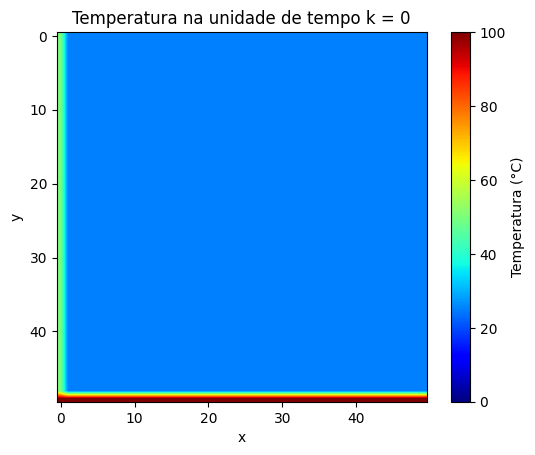

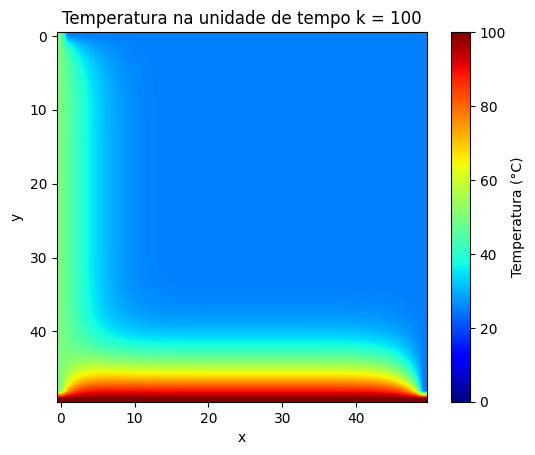

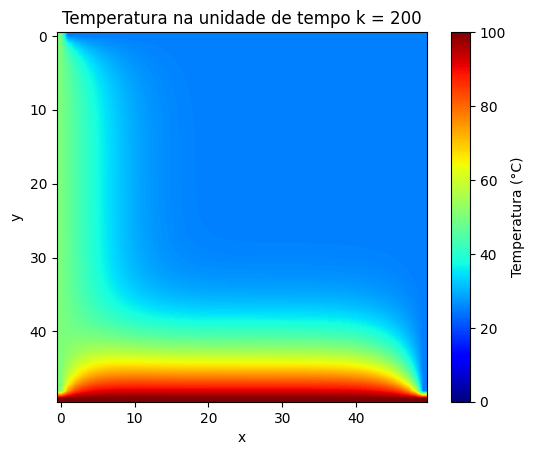

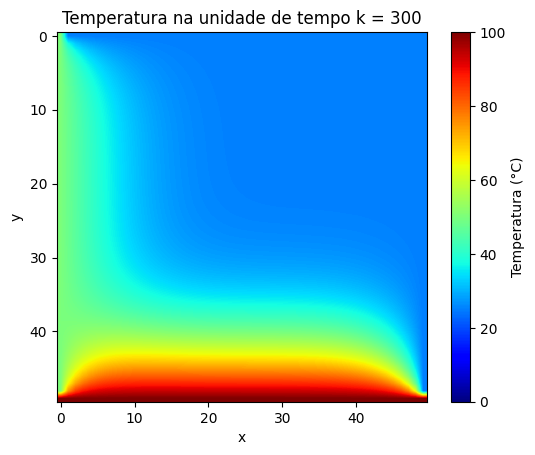

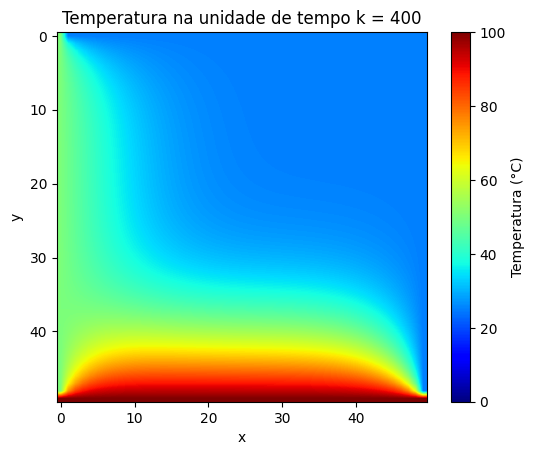

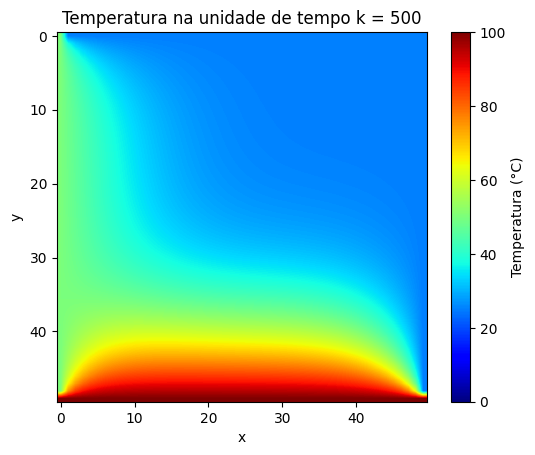

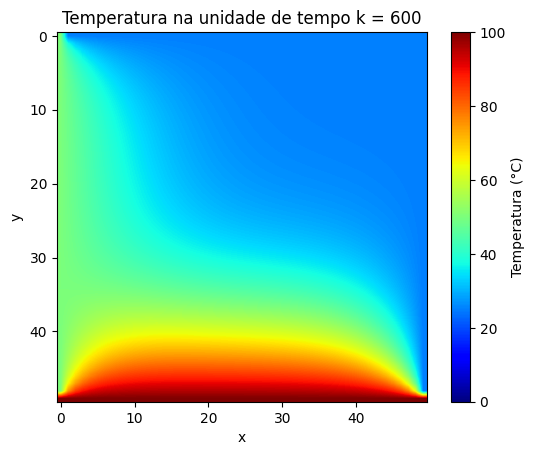

In [11]:
u = init()
# cálculo das temperaturas em todos os pontos
u = calcular(u, madeira)

iteracoes = 602
run(u, iteracoes)

# Resultados

A diferença da presença de calor nas superfícies é notável em certos pontos:

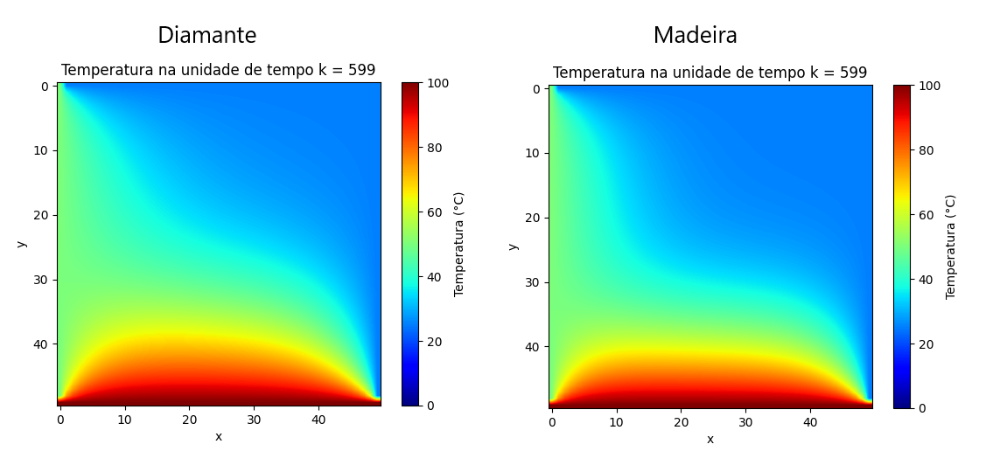

* No centro da superfície, a temperatura no diamante é ligeiramente superior à temperatura na madeira;
* Na parte inferior, a área com uma alta temperatura (acima de 70°C aproximadamente) no diamante é maior do que a área na madeira.


Ambas as situações são causadas pelo coeficiente de difusão térmica de cada material. Quanto maior esse coeficiente, maior a dispersão do calor numa determinada unidade de tempo.

O início é, de certa forma, parecido, uma vez que vemos apenas a área próxima da fonte receber calor. Ao longo do tempo, podemos ver a diferença, pois a difusão do calor dentro do próprio material é ditada por seu coeficiente, como afirmado anteriormente.

Vamos comparar o calor se dissipando nos 2 materiais:

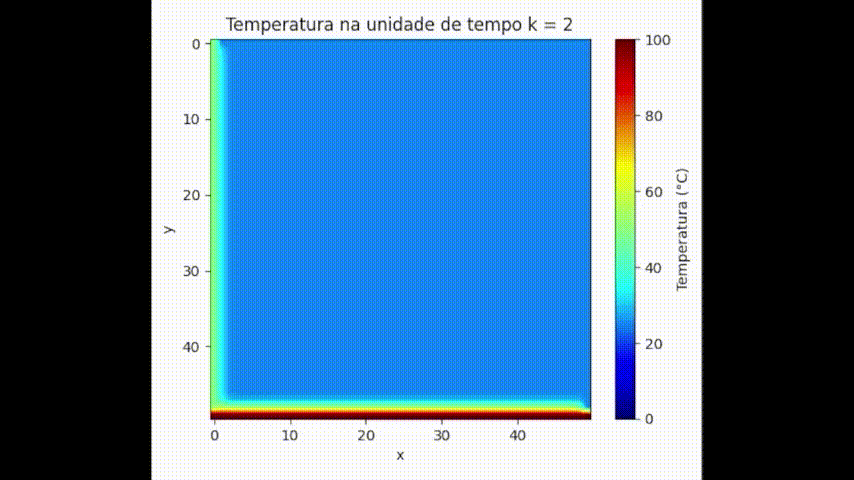

In [ ]:
# display do gif
gif_path = '/gdrive/MyDrive/COCADA/diamond.gif'

display(Image(filename=gif_path))

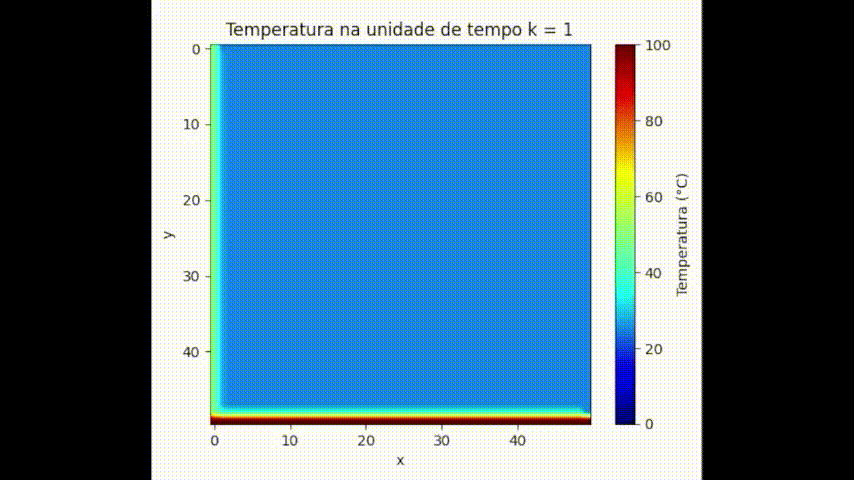

In [ ]:
gif_path = '/gdrive/MyDrive/COCADA/wood.gif'

display(Image(filename=gif_path))

Em seguida, vamos realizar outro teste. Dessa vez, utilizaremos o material *ouro* e a incidência de calor será diferente: vamos esquentando um pequeno pedaço de cada borda (de uma extremidade até a outra), desenhando uma espécie de "quadrado", simulando a aplicação de uma chama oriunda de um maçarico, se preferir pensar por esse lado. Vamos ver o efeito que vai dar!

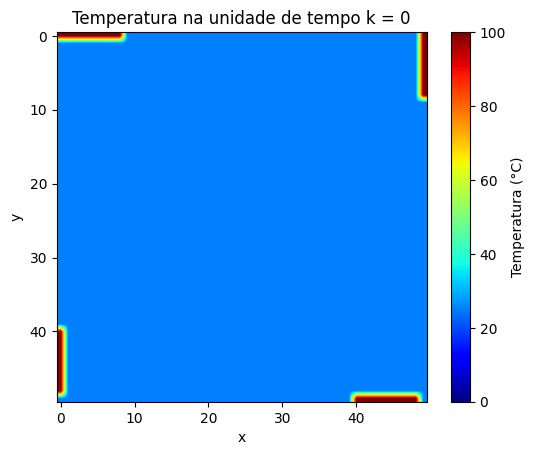

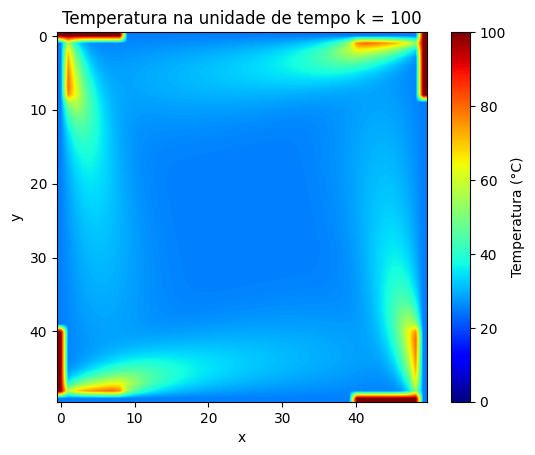

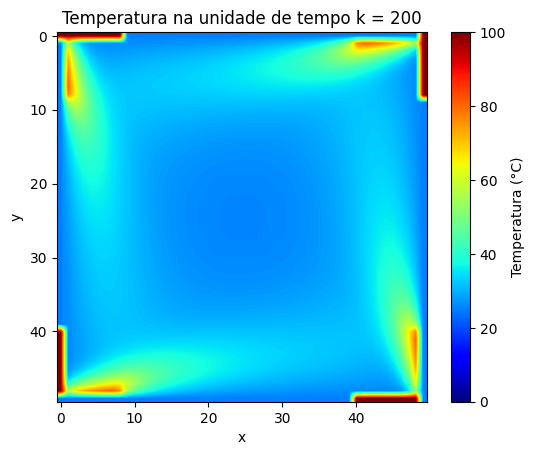

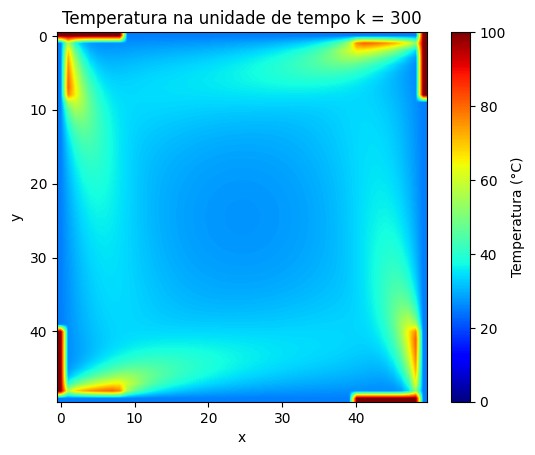

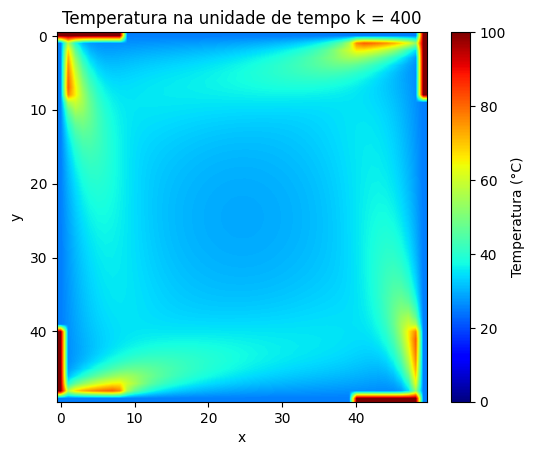

...

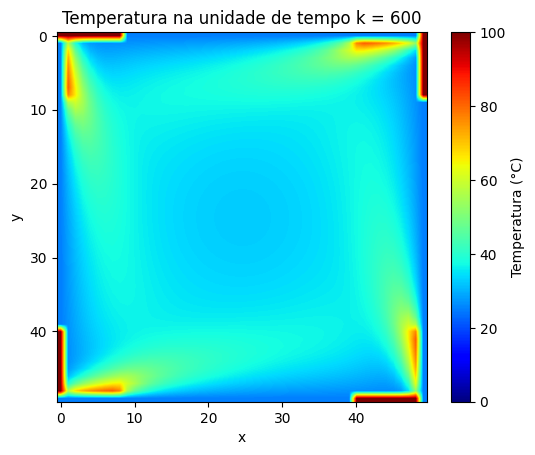

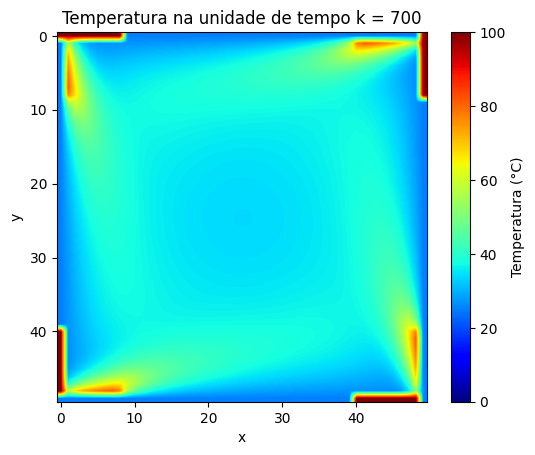

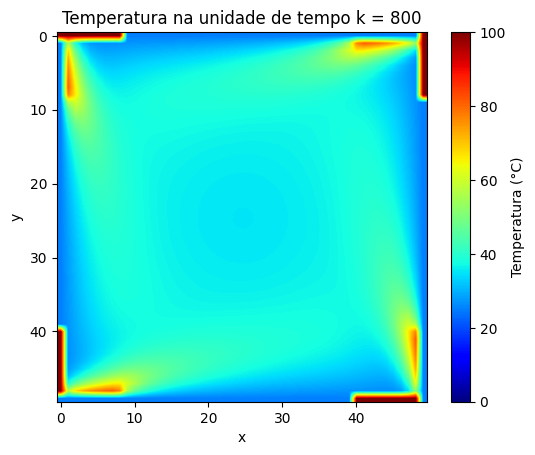

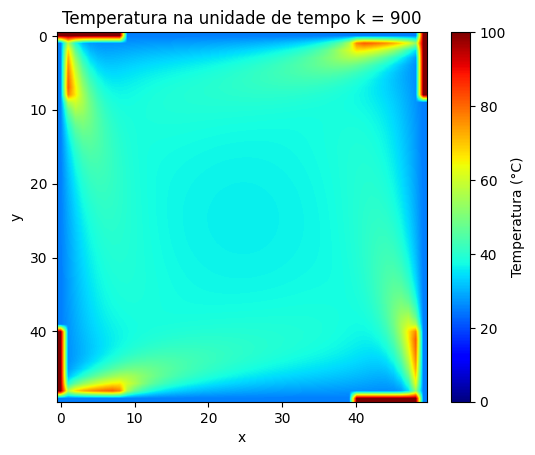

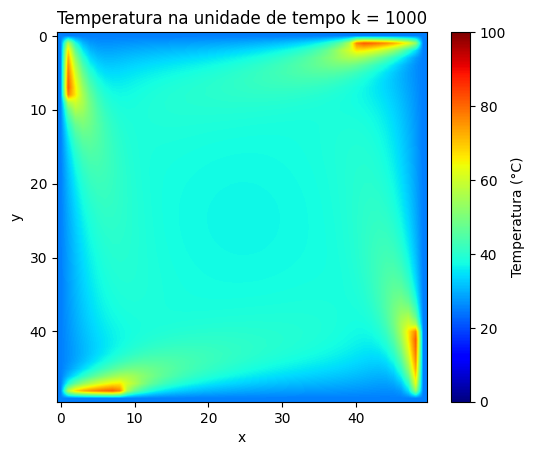

In [12]:
iteracoes = 1002

def init2():
    # criando a matriz
    u = np.empty((iteracoes, linhas, colunas)) #u[tempo][x][y]

    u_inicial = 25 # 25°C - temperatura ambiente

    # inicializando a matriz na condição inicial
    u.fill(u_inicial)

    temp = 100

    for j in range(10): # o desenho se repetirá 10 vezes
        for i in range(100): # o desenho está explicitado no enunciado
            ponto = int(round((i / 99) * 40)) # para ficar entre 0 e 40

            #sup e inf
            u[(j*100)+i, 0, ponto:(ponto+9)] = temp
            u[(j*100)+i, 49, (40-ponto):(49-ponto)] = temp
            #esq e dir
            u[(j*100)+i, (40-ponto):(49-ponto), 0] = temp
            u[(j*100)+i, ponto:(ponto+9), 49] = temp

    return u

u = init2()
# cálculo das temperaturas em todos os pontos
u = calcular(u, ouro)

run(u, iteracoes)

Bem interessante! O calor vai se aproximando do centro da superfície em um formato circular, e essa área vai se esquentando de pouco em pouco. (infelizmente, o gif tira um pouco da qualidade das imagens, mas na célula com o código acima é possível ver com mais precisão em qualquer unidade de tempo).

ATENÇÃO: Se você está vendo este projeto no GitHub, visite a pasta 'gifs' para visualizar as animações do calor se propagando. Infelizmente, tive que retirar para o arquivo ser aceito na plataforma =( (estava muito pesado antes).

# Conclusão

Foi feita uma análise da propagação do calor em superfícies bidimensionais de diferentes materiais, utilizando a equação do calor e a técnica de diferenças finitas para simulação, tornando possível visualizar a evolução da temperatura ao longo do tempo, representando-a por meio de um mapa de calor suavizado pela Interpolação Bilinear em um plano cartesiano convencional.

Este estudo é relevante para diversas áreas, incluindo engenharia, física e ciências dos materiais, proporcionando uma base sólida para análises mais avançadas de transferência de calor em ambientes complexos. A utilização de técnicas computacionais, como diferenças finitas e interpolação de pontos, abre portas para a exploração de cenários práticos, contribuindo para o desenvolvimento de soluções e otimização de processos termicamente sensíveis.

# Referências

* Heat equation - Wikipedia https://en.wikipedia.org/wiki/Heat_equation

* Solving 2D Heat Equation Numerically using Python - Medium https://levelup.gitconnected.com/solving-2d-heat-equation-numerically-using-python-3334004aa01a

* Thermal diffusivity - Wikipedia https://en.wikipedia.org/wiki/Thermal_diffusivity

* Interpolação bilinear - Wikipedia https://pt.wikipedia.org/wiki/Interpola%C3%A7%C3%A3o_bilinear